# Data to Insights - Demo

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import datetime as dt
import inspect
from functools import wraps
from typing import Callable

import hiplot
import lightgbm
import pandas as pd
import pygwalker
import shap
import sklearn.datasets
from ydata_profiling import ProfileReport

%matplotlib inline

INFO: Pandas backend loaded 1.5.3
INFO: Numpy backend loaded 1.23.5
INFO: Pyspark backend NOT loaded
INFO: Python backend loaded


## Ingestion

**Features**:
- **MedInc**: median income in block group
- **HouseAge**: median house age in block group
- **AveRooms**: average number of rooms per household
- **AveBedrms**: average number of bedrooms per household
- **Population**: block group population
- **AveOccup**: average number of household members
- **Latitude**: block group latitude
- **Longitude**: block group longitude

**Target**:
- **MedInc**: Median house value for California districts in [hundreds of thousands of dollars ($100,000)]

More info: https://scikit-learn.org/stable/datasets/real_world.html#california-housing-dataset

In [3]:
data_raw = pd.concat(
    sklearn.datasets.fetch_california_housing(as_frame=True, return_X_y=True), axis=1
)

In [4]:
data_raw.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [5]:
data_raw.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


## Pre-Processing & Feature Engineering 

In [6]:
def log_step(func):
    @wraps(func)
    def wrapper(*args, **kwargs):
        # Run function with timer
        tic = dt.datetime.now()
        result = func(*args, **kwargs)
        time_taken = f"{str(round((dt.datetime.now() - tic).total_seconds(), 1))}s"

        # Get result shape
        try:
            rows = result.shape[0]
            cols = result.shape[1]
        except Exception as e:
            print(f"{e} is ignored")
            rows = 0
            cols = 0

        # Get function arguments
        func_args = inspect.signature(func).bind(*args, **kwargs).arguments
        arguments = ", ".join(
            [f"{k}: {i}" for k, i in func_args.items() if k != "dataf"]
        )
        args_max_len = 35
        if len(arguments) > args_max_len:
            arguments = arguments[:args_max_len] + "..."

        # Print the log
        print(
            f"{func.__name__:<30} "
            + f"| rows: {rows:>8,} "
            + f"| cols: {cols:>4,} "
            + f"| t: {time_taken:>6} "
            + f"| args: {arguments} "
        )
        return result

    return wrapper


@log_step
def start_pipeline(dataf):
    return dataf.copy(deep=True)


@log_step
def query(dataf, query):
    return dataf.query(query)

In [7]:
data = (
    data_raw.pipe(start_pipeline)
    .pipe(query, query="MedInc <= 10")
    .pipe(query, query="AveRooms <=10")
    .pipe(query, query=("0.8 <= AveBedrms <=1.4"))
    .pipe(query, query=("Population <= 5000"))
    .pipe(query, query=("AveOccup <= 6"))
    .pipe(query, query=("MedHouseVal <= 5"))
    .assign(west_of_lon120=lambda d: d["Longitude"] <= -120)
    .assign(north_of_lat36=lambda d: d["Latitude"] >= 36)
)

start_pipeline                 | rows:   20,640 | cols:    9 | t:   0.0s | args:  
query                          | rows:   20,332 | cols:    9 | t:   0.0s | args: query: MedInc <= 10 
query                          | rows:   20,116 | cols:    9 | t:   0.0s | args: query: AveRooms <=10 
query                          | rows:   19,619 | cols:    9 | t:   0.0s | args: query: 0.8 <= AveBedrms <=1.4 
query                          | rows:   19,317 | cols:    9 | t:   0.0s | args: query: Population <= 5000 
query                          | rows:   19,232 | cols:    9 | t:   0.0s | args: query: AveOccup <= 6 
query                          | rows:   18,562 | cols:    9 | t:   0.0s | args: query: MedHouseVal <= 5 


In [8]:
data.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,west_of_lon120,north_of_lat36
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526,True,True
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585,True,True
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521,True,True
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413,True,True
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422,True,True


## Automated EDA

In [9]:
profile = ProfileReport(data)
profile.to_file("profiling-report-demo.html")

Export report to file: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 59.95it/s]


## HiPlot

In [10]:
hiplot.Experiment.from_dataframe(
    data[
        [
            "MedHouseVal",
            "MedInc",
            "AveRooms",
            "AveOccup",
        ]
    ]
).display()

<IPython.core.display.Javascript object>

## PyGWAler

In [11]:
pygwalker.walk(data, axis=1)

## XAI

**Train the ML model**

In [12]:
data

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal,west_of_lon120,north_of_lat36
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526,True,True
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585,True,True
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521,True,True
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413,True,True
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422,True,True
...,...,...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781,True,True
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771,True,True
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923,True,True
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847,True,True


In [13]:
target = data["MedHouseVal"]
inputs = data[
    [
        "MedInc",
        "HouseAge",
        "AveRooms",
        "AveBedrms",
        "Population",
        "AveOccup",
        "Latitude",
        "Longitude",
        "west_of_lon120",
        "north_of_lat36",
    ]
]

ml_model = lightgbm.LGBMRegressor()

ml_model.fit(X=inputs, y=target)

LGBMRegressor()

**Compute SHAP values**

In [14]:
shap_explainer = shap.Explainer(model=ml_model)
shap_values = shap_explainer(inputs)

In [15]:
shap_values_df = pd.DataFrame(shap_values.values, columns=inputs.columns)

**Visualise local and global explainations**

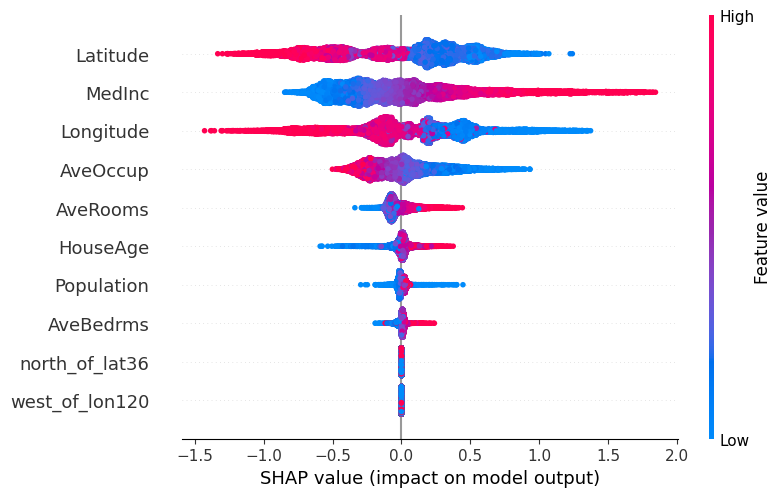

In [16]:
shap.plots.beeswarm(shap_values=shap_values)

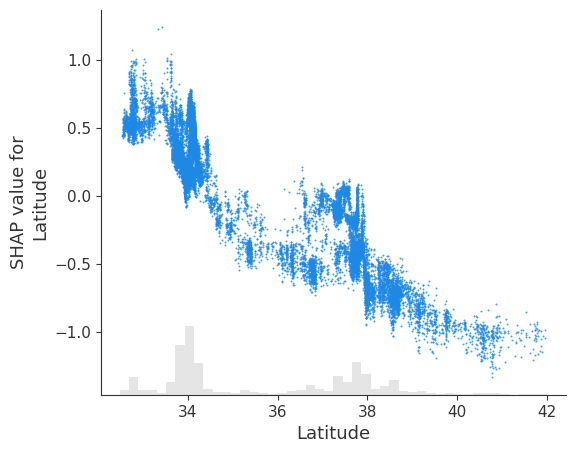

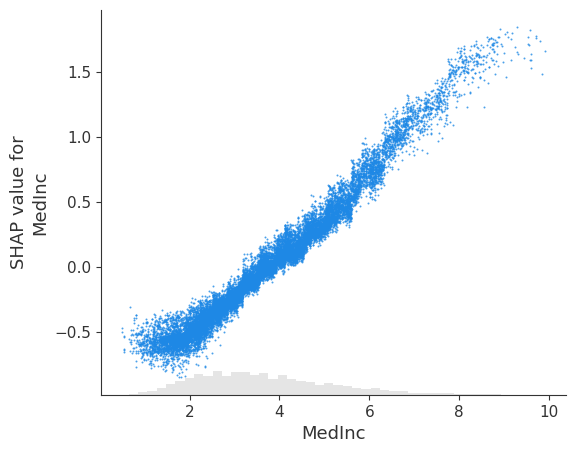

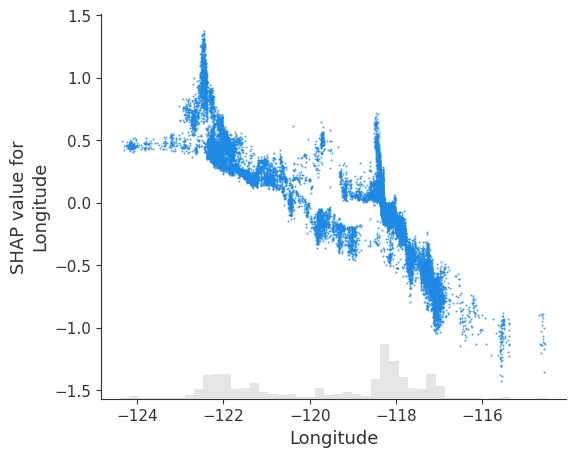

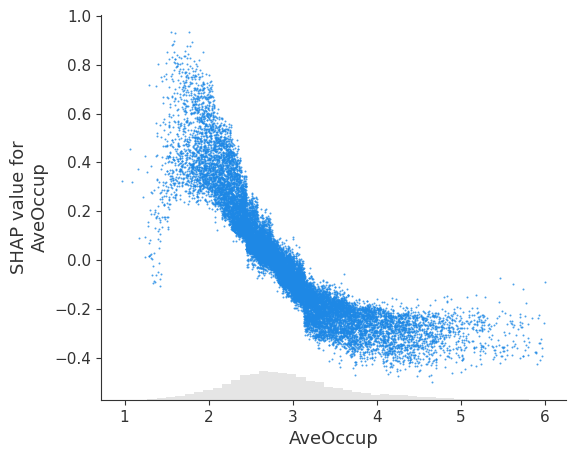

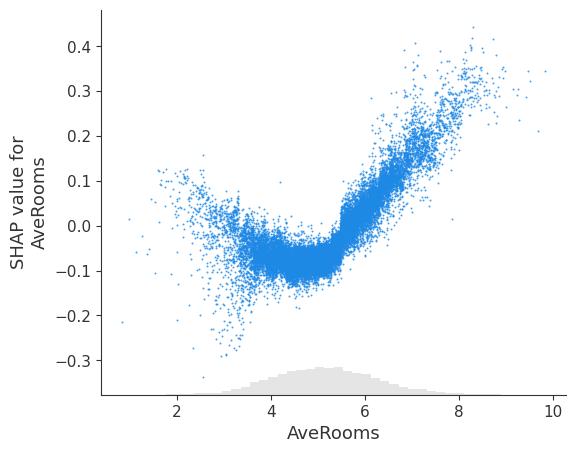

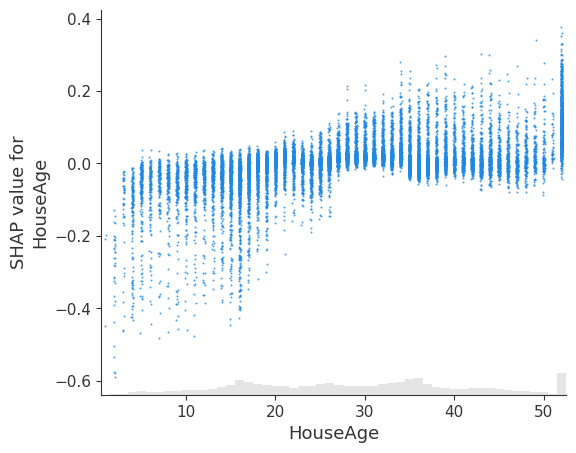

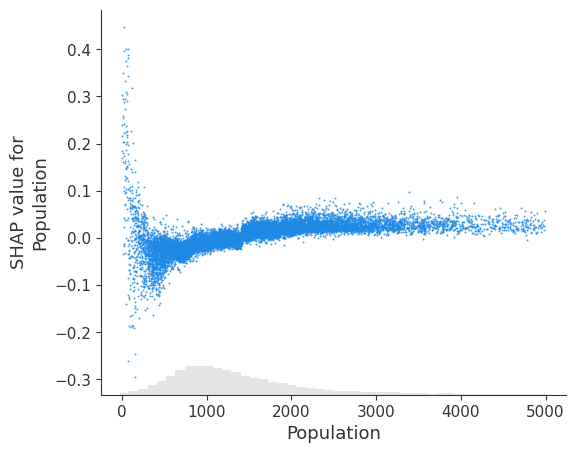

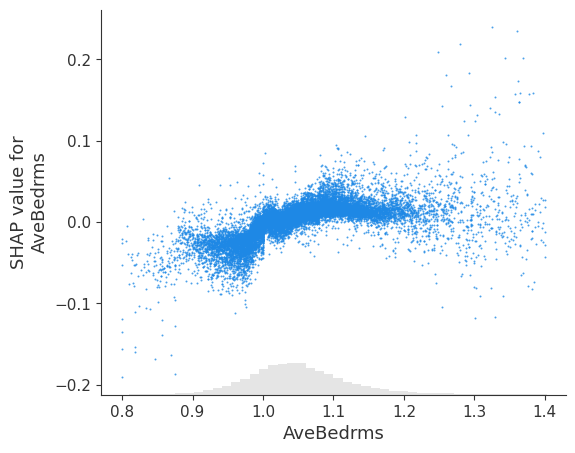

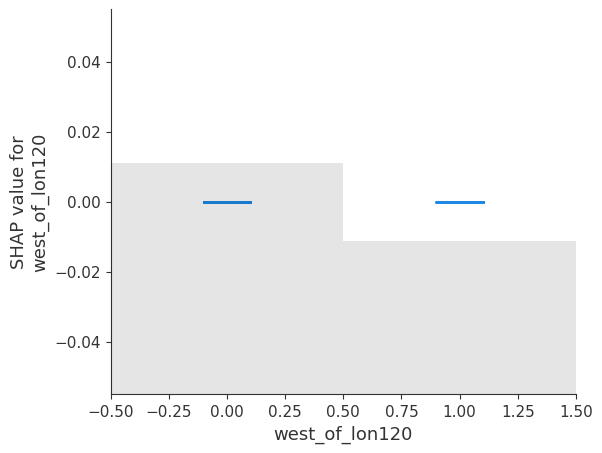

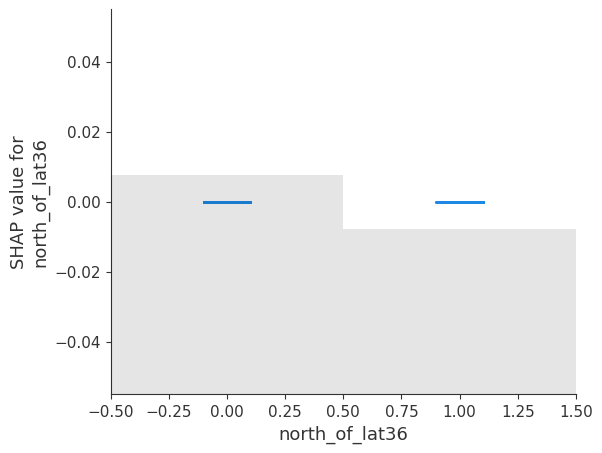

In [17]:
col_by_shap_abs = shap_values_df.abs().mean().sort_values(ascending=False).index.values
for c in  col_by_shap_abs:
    shap.plots.scatter(shap_values[:,c], dot_size=2, alpha=.8)

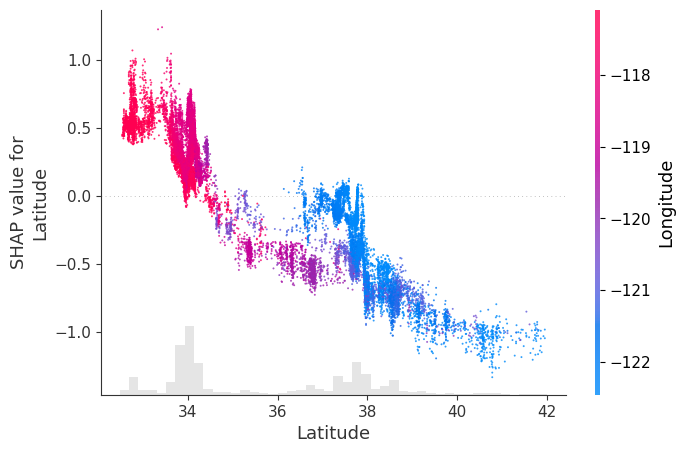

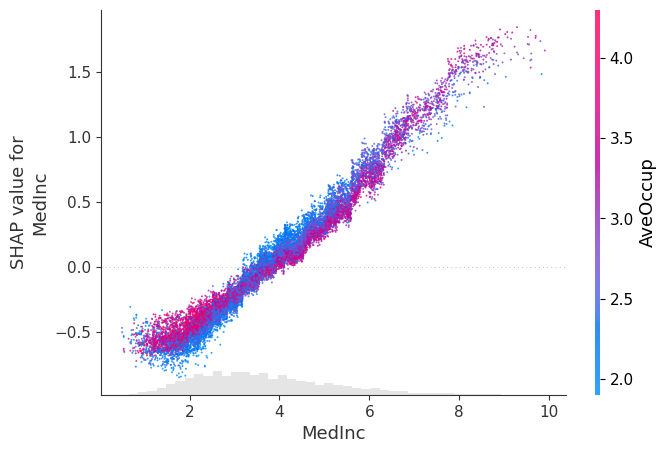

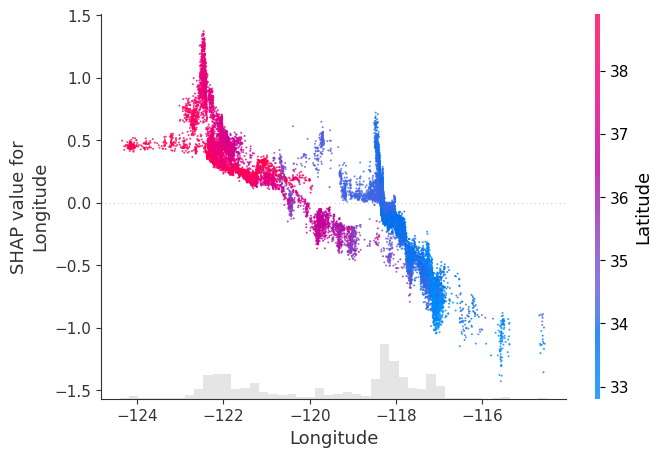

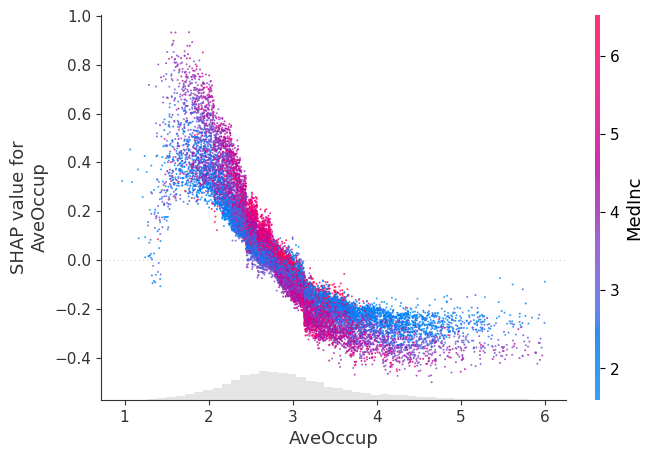

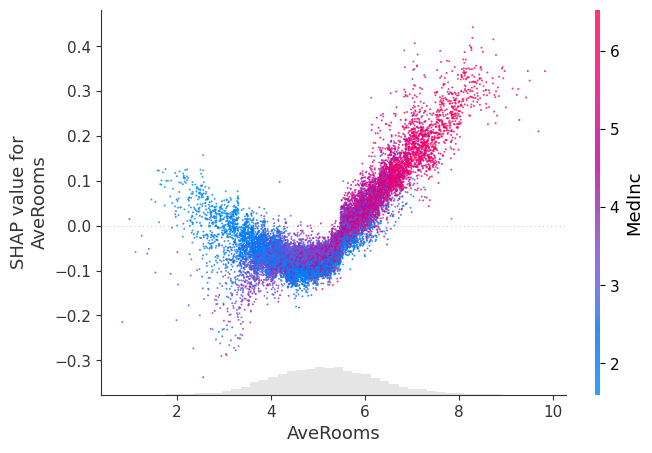

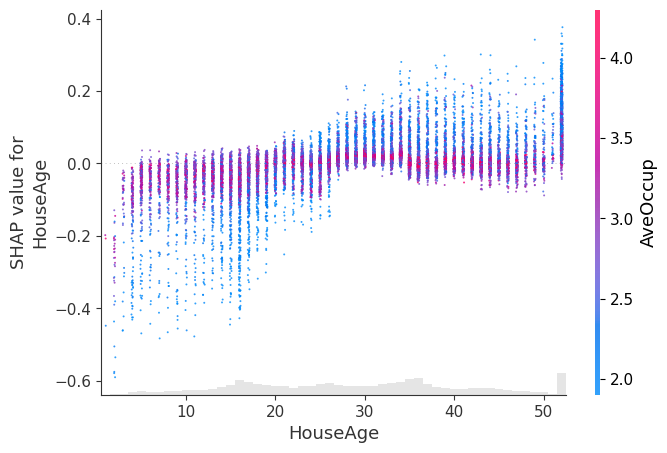

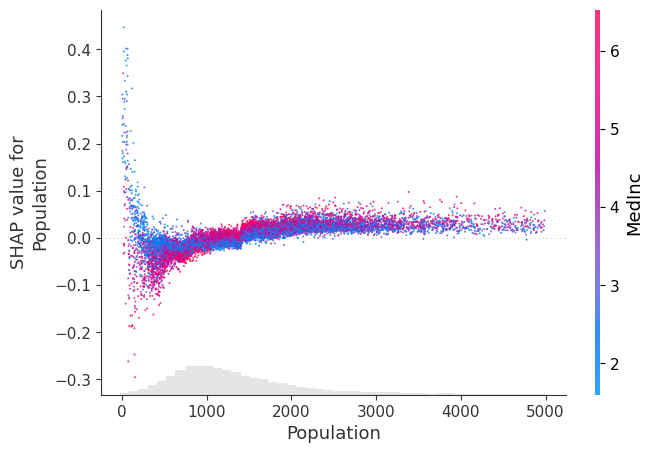

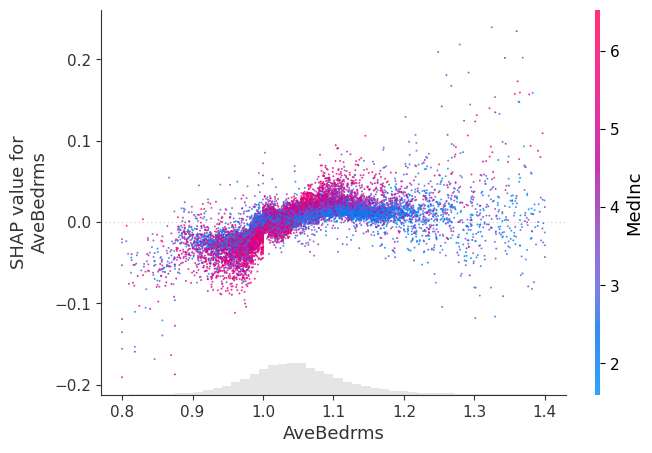

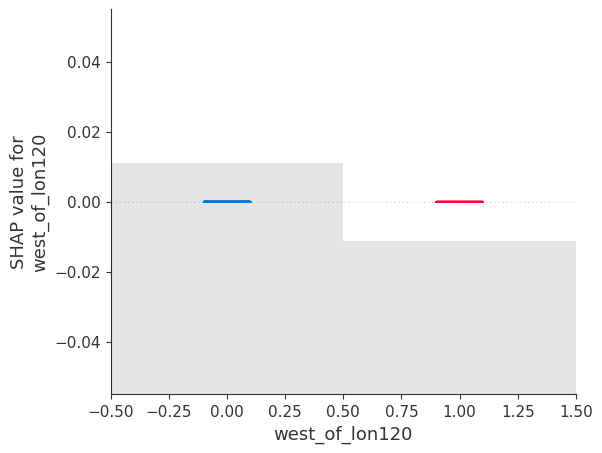

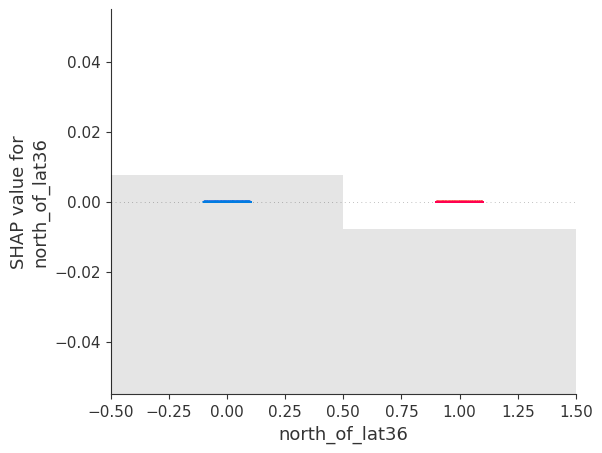

In [18]:
for c in col_by_shap_abs:
    shap.plots.scatter(shap_values[:,c], dot_size=2, alpha=.8, color=shap_values)